In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import folium
from folium.plugins import MarkerCluster


stop = pd.read_csv('stop_and_search.csv')
stop

,Type,Date,Latitude,Longitude,Gender,Age range,Self-defined ethnicity,Officer-defined ethnicity,Legislation,Object of search,Outcome,Removal of more than just outer clothing
0,Person search,2017-03-01 11:10:54+00:00,51.486273,-2.521011,Female,over 34,NaN,NaN,Misuse of Drugs Act 1971 (section 23),Controlled drugs,Nothing found - no further action,False
1,Person search,2017-03-01 11:32:44+00:00,51.187611,-2.546681,Male,10-17,White - White British (W1),White,Police and Criminal Evidence Act 1984 (section 1),Article for use in theft,Nothing found - no further action,False
2,Person search,2017-03-01 12:10:53+00:00,51.346507,-2.971149,Male,over 34,NaN,NaN,Misuse of Drugs Act 1971 (section 23),Controlled drugs,Nothing found - no further action,False
3,Person search,2017-03-01 12:10:53+00:00,51.346507,-2.971149,Male,over 34,NaN,NaN,Misuse of Drugs Act 1971 (section 23),Controlled drugs,Nothing found - no further action,False
4,Person search,2017-03-01 14:02:17+00:00,50.941519,-2.640688,Male,over 34,White - White British (W1),White,Misuse of Drugs Act 1971 (section 23),Controlled drugs,Nothing found - no further action,False
...,...,...,...,...,...,...,...,...,...,...,...,...
1161745,Person search,2020-02-26 11:30:00+00:00,51.362947,-1.964804,Male,18-24,White - English/Welsh/Scottish/Northern Irish/...,White,Misuse of Drugs Act 1971 (section 23),Controlled drugs,A no further action disposal,False
1161746,Person search,2020-02-27 16:01:00+00:00,51.162148,-1.766691,Male,10-17,White - English/Welsh/Scottish/Northern Irish/...,White,Misuse of Drugs Act 1971 (section 23),Controlled drugs,A no further action disposal,False
1161747,Person search,2020-02-28 10:50:00+00:00,51.355452,-1.983407,Male,over 34,White - English/Welsh/Scottish/Northern Irish/...,White,Misuse of Drugs Act 1971 (section 23),Controlled drugs,A no further action disposal,False
1161748,Person and Vehicle search,2020-02-28 11:15:00+00:00,51.063715,-1.837425,Male,25-34,White - English/Welsh/Scottish/Northern Irish/...,White,Misuse of Drugs Act 1971 (section 23),Controlled drugs,A no further action disposal,True


# Number of occurrences for each type of search

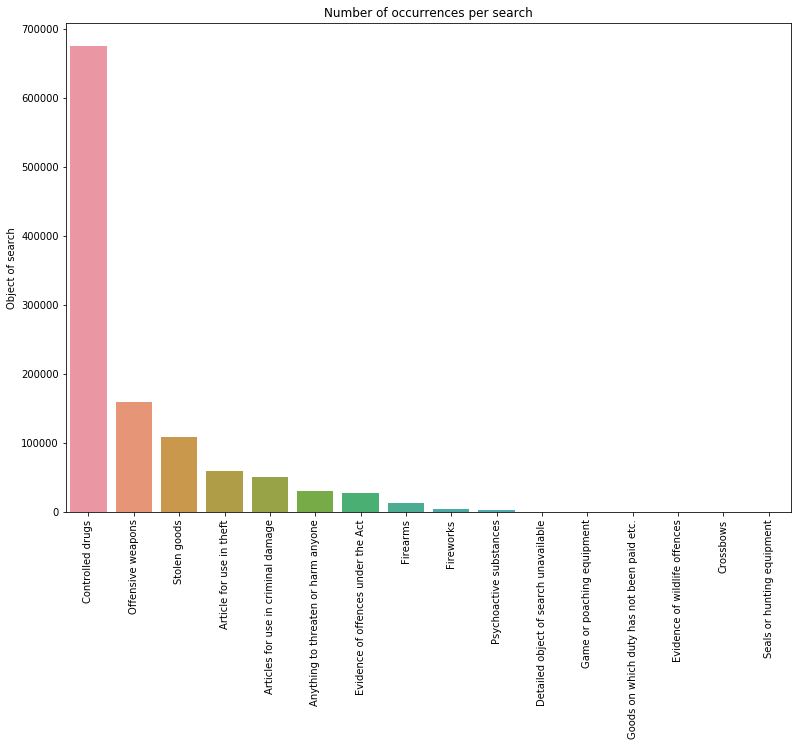

In [7]:
stop['Object of search'].value_counts()

fig1, ax1 = plt.subplots(figsize =(13,9))
ax1 = sns.barplot(x=stop['Object of search'].value_counts().index.tolist(), y=stop['Object of search'].value_counts()).set_title("Number of occurrences per search")
plt.xticks(rotation=90)
plt.show()

# Pie charts showing the percentage of arrest for the top 3 types of search

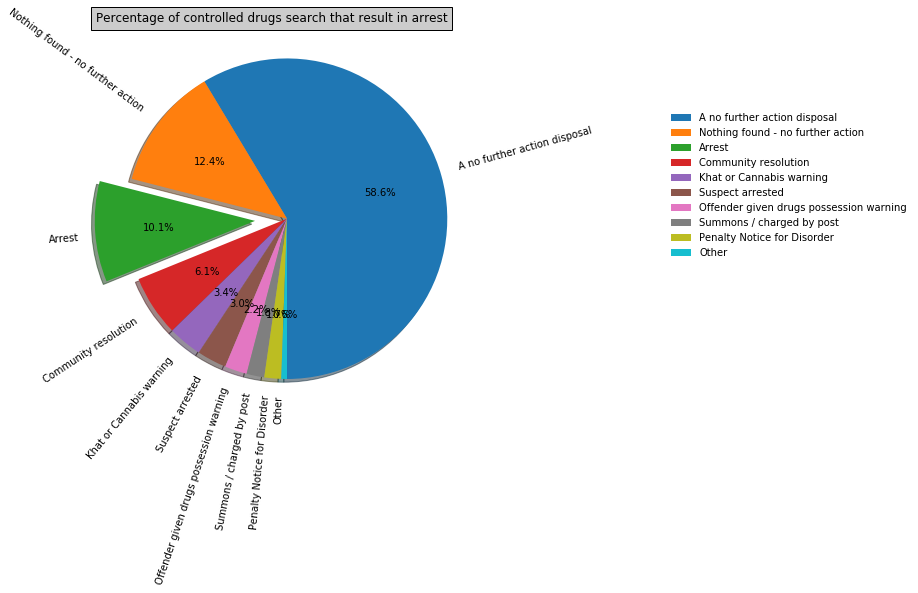

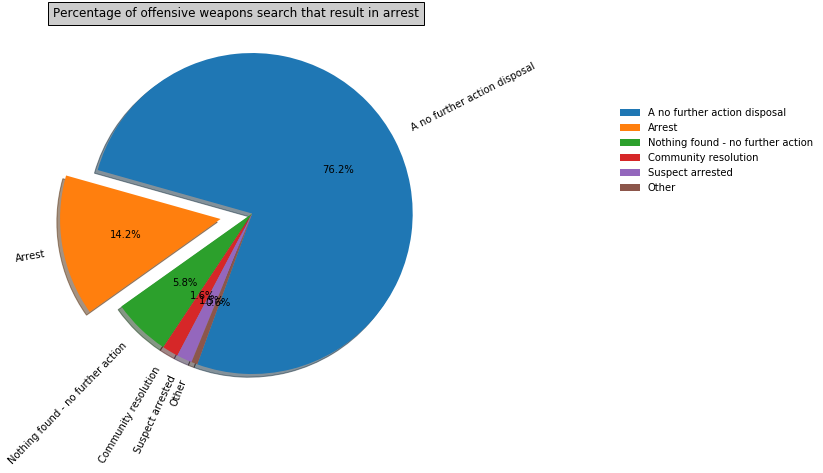

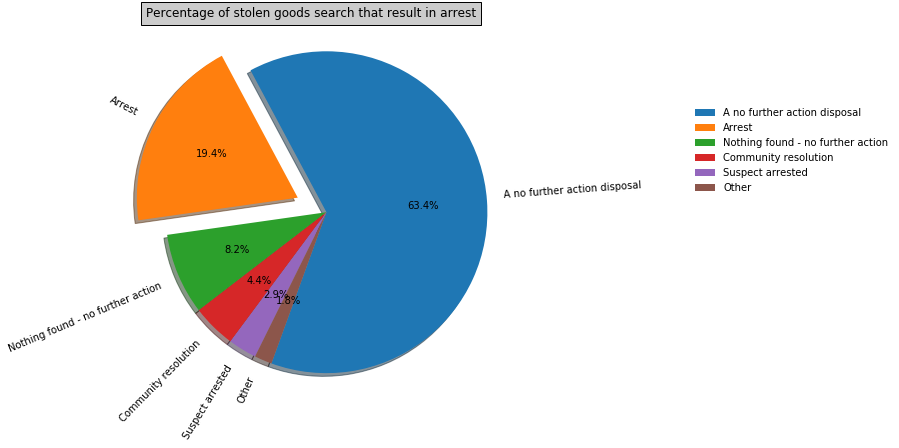

In [123]:
#Reason for search was because of controlled drugs
controlled = stop[stop['Object of search'] == 'Controlled drugs']

#percentage of people that are arrested when found with controlled drugs
arrest = controlled['Outcome'].value_counts().index.tolist()
arrest2 = []

# Removing the Outcomes that are small and creating an 'Other' outcome
for i in range(len(arrest)-7):
    arrest2.append(arrest[i])
arrest2.append('Other')

# Getting the values and putting them on a list
arrestN = controlled['Outcome'].value_counts().tolist()
arrestN2 = []
for i in range(len(arrestN)-7):
    arrestN2.append(arrestN[i])

# Adding together the number for the outcomes that were remove for the 'Other' outcome
arrestN2.append(sum(arrestN[(len(arrestN)-7)::len(arrestN)]))
    
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = arrest2
sizes = arrestN2

fig1, ax1 = plt.subplots(figsize =(7,7))
ax1.pie(sizes, labels=labels, explode=(0,0,0.2,0,0,0,0,0,0,0), autopct='%1.1f%%', rotatelabels = True, shadow=True, startangle=270)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Percentage of controlled drugs search that result in arrest', bbox={'facecolor':'0.8', 'pad':5})
plt.legend(frameon=False, bbox_to_anchor=(1.5,0.8))
plt.show()

#Reason for search was because of Offensive weapons
offensive = stop[stop['Object of search'] == 'Offensive weapons']

#percentage of people that are arrested when found with controlled drugs
arrest = offensive['Outcome'].value_counts().index.tolist()
arrest2 = []

# Removing the Outcomes that are small and creating an 'Other' outcome
for i in range(len(arrest)-11):
    arrest2.append(arrest[i])
arrest2.append('Other')

# Getting the values and putting them on a list
arrestN = offensive['Outcome'].value_counts().tolist()
arrestN2 = []
for i in range(len(arrestN)-11):
    arrestN2.append(arrestN[i])

# Adding together the number for the outcomes that were remove for the 'Other' outcome
arrestN2.append(sum(arrestN[(len(arrestN)-11)::len(arrestN)]))
    
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = arrest2
sizes = arrestN2

fig1, ax1 = plt.subplots(figsize =(7,7))
ax1.pie(sizes, labels=labels, explode=(0,0.2,0,0,0,0), autopct='%1.1f%%', rotatelabels = True, shadow=True, startangle=250)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Percentage of offensive weapons search that result in arrest', bbox={'facecolor':'0.8', 'pad':5})
plt.legend(frameon=False, bbox_to_anchor=(2.0,0.8))
plt.show()

#Reason for search was because of Stolen goods
stolen = stop[stop['Object of search'] == 'Stolen goods']

#percentage of people that are arrested when found with controlled drugs
arrest = stolen['Outcome'].value_counts().index.tolist()
arrest2 = []

# Removing the Outcomes that are small and creating an 'Other' outcome
for i in range(len(arrest)-11):
    arrest2.append(arrest[i])
arrest2.append('Other')

# Getting the values and putting them on a list
arrestN = stolen['Outcome'].value_counts().tolist()
arrestN2 = []
for i in range(len(arrestN)-11):
    arrestN2.append(arrestN[i])

# Adding together the number for the outcomes that were remove for the 'Other' outcome
arrestN2.append(sum(arrestN[(len(arrestN)-11)::len(arrestN)]))
    
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = arrest2
sizes = arrestN2

fig1, ax1 = plt.subplots(figsize =(7,7))
ax1.pie(sizes, labels=labels, explode=(0,0.2,0,0,0,0), autopct='%1.1f%%', rotatelabels = True, shadow=True, startangle=250)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Percentage of stolen goods search that result in arrest', bbox={'facecolor':'0.8', 'pad':5})
plt.legend(frameon=False, bbox_to_anchor=(2.0,0.8))
plt.show()

In [29]:
# %%capture

#Reason for search was because of controlled drugs
controlled = stop[stop['Object of search'] == 'Controlled drugs']
controlled = controlled[controlled['Outcome'] == 'Arrest']
controlled = controlled.dropna()

#corrdinates for UK
CHI_COORDINATES = (51.5, -3)

# create empty map zoomed in on San Francisco
map = folium.Map(location=CHI_COORDINATES, zoom_start=6, tiles = 'year')

mc = MarkerCluster();

for row in controlled.iterrows():
    mc.add_child(folium.Marker(location = [row[1]['Latitude'],row[1]['Longitude']]))
    
map.add_child(mc)

display(map)

# Map showcasing controlled dugs search that resulted in an arrest by year in the UK

In [42]:
from folium import FeatureGroup, LayerControl, Map, Marker

#Reason for search was because of controlled drugs
controlled = stop[stop['Object of search'] == 'Controlled drugs']
controlled = controlled[controlled['Outcome'] == 'Arrest']
controlled = controlled.dropna()
controlled['Date'] = pd.to_datetime(controlled['Date'])

#corrdinates for UK
UK_COORDINATES = (51.9, -3)

# create empty map zoomed in on United Kingdom
map = folium.Map(location=UK_COORDINATES, zoom_start=6, tiles = 'Stamen Terrain')

#Feature group for each year available
feature_group1 = FeatureGroup(name='2017')
feature_group2 = FeatureGroup(name='2018')
feature_group3 = FeatureGroup(name='2019')
feature_group4 = FeatureGroup(name='2020')

#Marker cluster for each feature group
mc1 = MarkerCluster();
mc2 = MarkerCluster();
mc3 = MarkerCluster();
mc4 = MarkerCluster();

#Adding the Markers to cluster depending on the year
for row in controlled.iterrows():
    if row[1]['Date'].year == 2017:
        mc1.add_child(folium.Marker(location = [row[1]['Latitude'],row[1]['Longitude']]))
    elif row[1]['Date'].year == 2018:
        mc2.add_child(folium.Marker(location = [row[1]['Latitude'],row[1]['Longitude']]))
    elif row[1]['Date'].year == 2019:
        mc3.add_child(folium.Marker(location = [row[1]['Latitude'],row[1]['Longitude']]))
    elif row[1]['Date'].year == 2020:
        mc4.add_child(folium.Marker(location = [row[1]['Latitude'],row[1]['Longitude']]))
    
#Adding the marker cluster to its corresponding feature group
feature_group1.add_child(mc1)
feature_group2.add_child(mc2)
feature_group3.add_child(mc3)
feature_group4.add_child(mc4)

#Adding the feature groups to the map
map.add_child(feature_group1)
map.add_child(feature_group2)
map.add_child(feature_group3)
map.add_child(feature_group4)
map.add_child(LayerControl())

#Displaying the map
display(map)

# What gender commits the most crimes?

AttributeError: 'Rectangle' object has no property 'title'

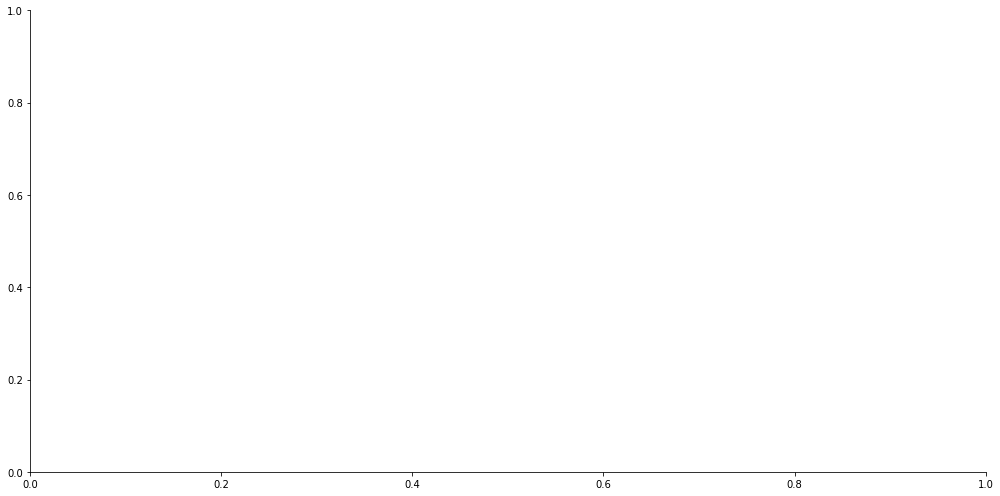

In [8]:
stop_bar = stop['Gender'].value_counts().rename_axis('Gender').reset_index(name = 'Occurrences')
sns.catplot(data=stop_bar,x='Gender', y='Occurrences', kind='bar', ci=None, aspect=2, height=7);
plt.xticks(rotation=90);

In [4]:
import plotly.graph_objects as go

#Filtering the dataset for stops in 2017
gender2017 = stop.copy()
gender2017['Date'] = pd.to_datetime(stop['Date'])
gender2017 = gender2017[gender2017['Date'].dt.year == 2017]

#Filtering the dataset for stops in 2018
gender2018 = stop.copy()
gender2018['Date'] = pd.to_datetime(stop['Date'])
gender2018 = gender2018[gender2018['Date'].dt.year == 2018]

#Filtering the dataset for stops in 2019
gender2019 = stop.copy()
gender2019['Date'] = pd.to_datetime(stop['Date'])
gender2019 = gender2019[gender2019['Date'].dt.year == 2019]

#Filtering the dataset for stops in 2020
gender2020 = stop.copy()
gender2020['Date'] = pd.to_datetime(stop['Date'])
gender2020 = gender2020[gender2020['Date'].dt.year == 2020]

years = [2017, 2018, 2019, 2020]

fig = go.Figure()

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Male']), len(gender2018[gender2018['Gender'] == 'Male']),
                  len(gender2019[gender2019['Gender'] == 'Male']), len(gender2020[gender2020['Gender'] == 'Male'])],
                name='Male',
                marker_color='rgb(55, 83, 109)'
                ))

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Female']), len(gender2018[gender2018['Gender'] == 'Female']),
                  len(gender2019[gender2019['Gender'] == 'Female']), len(gender2020[gender2020['Gender'] == 'Female'])],
                name='Female',
                marker_color='rgb(26, 118, 255)'
                ))

fig.update_layout(
    title='Female vs Male crime Numbers throughout the years',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='USD (millions)',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

fig.show()

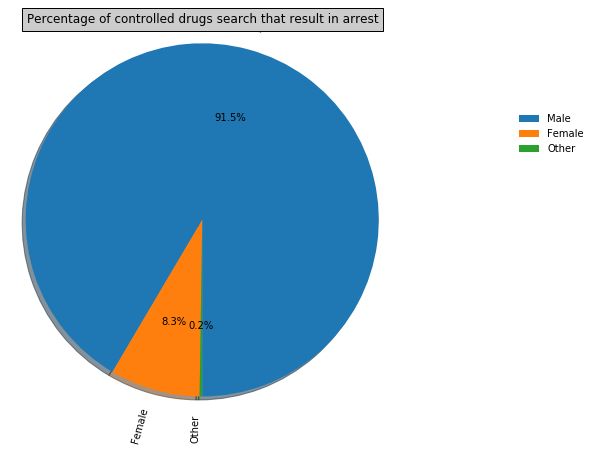

In [59]:
gender2017['Date'] = pd.to_datetime(stop['Date'])
gender2017 = gender2017[gender2017['Date'].year == 2017]

gender2018['Date'] = pd.to_datetime(stop['Date'])
gender2018 = gender2018[gender2018['Date'].year == 2018]

gender2019['Date'] = pd.to_datetime(stop['Date'])
gender2019 = gender2019[gender2019['Date'].year == 2019]

gender2020['Date'] = pd.to_datetime(stop['Date'])
gender2020 = gender2020[gender2020['Date'].year == 2020]

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = stop_bar['Gender']
sizes = stop_bar['Occurrences']

fig1, ax1 = plt.subplots(figsize =(7,7))
ax1.pie(sizes, labels=labels, explode=(0,0,0), autopct='%1.1f%%', rotatelabels = True, shadow=True, startangle=270)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Percentage of controlled drugs search that result in arrest', bbox={'facecolor':'0.8', 'pad':5})
plt.legend(frameon=False, bbox_to_anchor=(1.5,0.8))
plt.show()

In [5]:
#Filtering the dataset for stops in 2017
gender2017 = stop.copy()
gender2017['Date'] = pd.to_datetime(stop['Date'])
gender2017 = gender2017[gender2017['Date'].dt.year == 2017]
gender2017 = gender2017[gender2017['Object of search'] == 'Controlled drugs']

#Filtering the dataset for stops in 2018
gender2018 = stop.copy()
gender2018['Date'] = pd.to_datetime(stop['Date'])
gender2018 = gender2018[gender2018['Date'].dt.year == 2018]
gender2018 = gender2018[gender2018['Object of search'] == 'Controlled drugs']

#Filtering the dataset for stops in 2019
gender2019 = stop.copy()
gender2019['Date'] = pd.to_datetime(stop['Date'])
gender2019 = gender2019[gender2019['Date'].dt.year == 2019]
gender2019 = gender2019[gender2019['Object of search'] == 'Controlled drugs']

#Filtering the dataset for stops in 2020
gender2020 = stop.copy()
gender2020['Date'] = pd.to_datetime(stop['Date'])
gender2020 = gender2020[gender2020['Date'].dt.year == 2020]
gender2020 = gender2020[gender2020['Object of search'] == 'Controlled drugs']

years = [2017, 2018, 2019, 2020]

fig = go.Figure()

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Male']), len(gender2018[gender2018['Gender'] == 'Male']),
                  len(gender2019[gender2019['Gender'] == 'Male']), len(gender2020[gender2020['Gender'] == 'Male'])],
                name='Male',
                marker_color='rgb(55, 83, 109)'
                ))

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Female']), len(gender2018[gender2018['Gender'] == 'Female']),
                  len(gender2019[gender2019['Gender'] == 'Female']), len(gender2020[gender2020['Gender'] == 'Female'])],
                name='Female',
                marker_color='rgb(26, 118, 255)'
                ))

fig.update_layout(
    title='Female vs Male crime Numbers for controlled drugs throughout the years',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='USD (millions)',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

fig.show()

In [6]:
#Filtering the dataset for stops in 2017
gender2017 = stop.copy()
gender2017['Date'] = pd.to_datetime(stop['Date'])
gender2017 = gender2017[gender2017['Date'].dt.year == 2017]
gender2017 = gender2017[gender2017['Object of search'] == 'Offensive weapons']

#Filtering the dataset for stops in 2018
gender2018 = stop.copy()
gender2018['Date'] = pd.to_datetime(stop['Date'])
gender2018 = gender2018[gender2018['Date'].dt.year == 2018]
gender2018 = gender2018[gender2018['Object of search'] == 'Offensive weapons']

#Filtering the dataset for stops in 2019
gender2019 = stop.copy()
gender2019['Date'] = pd.to_datetime(stop['Date'])
gender2019 = gender2019[gender2019['Date'].dt.year == 2019]
gender2019 = gender2019[gender2019['Object of search'] == 'Offesnive weapons']

#Filtering the dataset for stops in 2020
gender2020 = stop.copy()
gender2020['Date'] = pd.to_datetime(stop['Date'])
gender2020 = gender2020[gender2020['Date'].dt.year == 2020]
gender2020 = gender2020[gender2020['Object of search'] == 'Offensive weapons']

years = [2017, 2018, 2019, 2020]

fig = go.Figure()

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Male']), len(gender2018[gender2018['Gender'] == 'Male']),
                  len(gender2019[gender2019['Gender'] == 'Male']), len(gender2020[gender2020['Gender'] == 'Male'])],
                name='Male',
                marker_color='rgb(55, 83, 109)'
                ))

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Female']), len(gender2018[gender2018['Gender'] == 'Female']),
                  len(gender2019[gender2019['Gender'] == 'Female']), len(gender2020[gender2020['Gender'] == 'Female'])],
                name='Female',
                marker_color='rgb(26, 118, 255)'
                ))

fig.update_layout(
    title='Female vs Male crime Numbers for offensive weapons throughout the years',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='USD (millions)',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

fig.show()

In [7]:
#Filtering the dataset for stops in 2017
gender2017 = stop.copy()
gender2017['Date'] = pd.to_datetime(stop['Date'])
gender2017 = gender2017[gender2017['Date'].dt.year == 2017]
gender2017 = gender2017[gender2017['Object of search'] == 'Stolen goods']

#Filtering the dataset for stops in 2018
gender2018 = stop.copy()
gender2018['Date'] = pd.to_datetime(stop['Date'])
gender2018 = gender2018[gender2018['Date'].dt.year == 2018]
gender2018 = gender2018[gender2018['Object of search'] == 'Stolen goods']

#Filtering the dataset for stops in 2019
gender2019 = stop.copy()
gender2019['Date'] = pd.to_datetime(stop['Date'])
gender2019 = gender2019[gender2019['Date'].dt.year == 2019]
gender2019 = gender2019[gender2019['Object of search'] == 'Stolen goods']

#Filtering the dataset for stops in 2020
gender2020 = stop.copy()
gender2020['Date'] = pd.to_datetime(stop['Date'])
gender2020 = gender2020[gender2020['Date'].dt.year == 2020]
gender2020 = gender2020[gender2020['Object of search'] == 'Stolen goods']

years = [2017, 2018, 2019, 2020]

fig = go.Figure()

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Male']), len(gender2018[gender2018['Gender'] == 'Male']),
                  len(gender2019[gender2019['Gender'] == 'Male']), len(gender2020[gender2020['Gender'] == 'Male'])],
                name='Male',
                marker_color='rgb(55, 83, 109)'
                ))

fig.add_trace(go.Bar(x=years,
                y=[len(gender2017[gender2017['Gender'] == 'Female']), len(gender2018[gender2018['Gender'] == 'Female']),
                  len(gender2019[gender2019['Gender'] == 'Female']), len(gender2020[gender2020['Gender'] == 'Female'])],
                name='Female',
                marker_color='rgb(26, 118, 255)'
                ))

fig.update_layout(
    title='Female vs Male crime Numbers for stolen goods throughout the years',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='USD (millions)',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        x=0,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

fig.show()

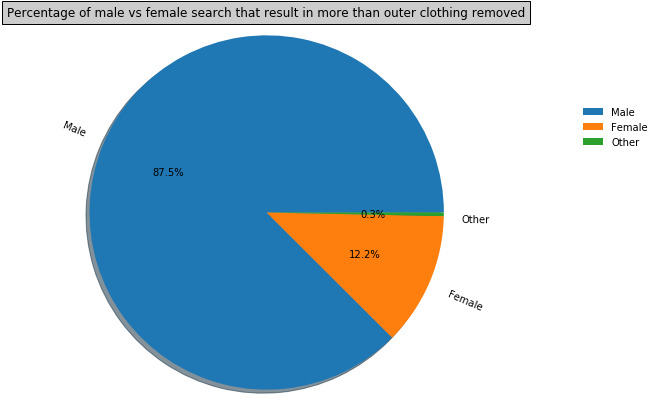

In [12]:
outer = stop.copy()
outer = outer[outer['Removal of more than just outer clothing'] == True]
outer = outer['Gender'].value_counts().rename_axis('Gender').reset_index(name = 'Occurrences')

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = outer['Gender']
sizes = outer['Occurrences']

fig1, ax1 = plt.subplots(figsize =(7,7))
ax1.pie(sizes, labels=labels, explode=(0,0,0), autopct='%1.1f%%', rotatelabels = True, shadow=True)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Percentage of male vs female search that result in more than outer clothing removed', bbox={'facecolor':'0.8', 'pad':5})
plt.legend(frameon=False, bbox_to_anchor=(1.5,0.8))
plt.show()